## Mapping genotype to phenotype information across magnifications

In [43]:
import tifffile as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
from scipy import spatial
import pandas as pd
import seaborn as sns
import PIL
from math import sqrt
import matplotlib.patheffects as PathEffects
import random
from tqdm import tqdm
from scipy.optimize import minimize
from PIL import Image
from os import listdir
from os.path import isfile, join
import warnings

In [44]:
from helper_functions import *

In [46]:
#this alters the amount of width taken up but notebook chunks
from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

### Set well that will be mapped between magnifications

In [47]:
well_ID = 12

### Retrieve coordinates associated with tile centers at each magnification 

In [48]:
lomag_tiles_dir = '/path/to/your/raw/low_magnification/tifs'
himag_tiles_dir = '/path/to/your/raw/high_magnification/tifs'

In [49]:
#replace these with your paths at runtime
lomag_tiles_dir = '/home/sansburys/shalemlab/v2_OpticalSequencing/data/VL1_JFX549_3May2023/input_files/raw/genotyping_tifs/cycle_0/'
himag_tiles_dir = '/home/sansburys/shalemlab/v2_OpticalSequencing/data/VL1_JFX549_3May2023/input_files/raw/phenotyping_tifs/Mito_wells/'

In [50]:
lomag_df = RetrieveCoordinates_in_df(lomag_tiles_dir, well_ID)
himag_df = RetrieveCoordinates_in_df(himag_tiles_dir, well_ID)

In [51]:
lomag_df.head()

,i_tilecenter,j_tilecenter
0,37501.500000,-14550.900391
1,39037.300781,-14552.599609
2,40572.800781,-14554.200195
3,42108.500000,-14556.200195
4,45178.000000,-16095.299805


### Use tile center coordinates from each magnification to identify pairs of tiles that correspond to approximately the same location in the well at each magnification

In [52]:
#calculate radius and centroid of higher magnification tiles
_well_radius, _well_centroid = ApproximateRadiusAndCentroid(himag_df)

In [53]:
well_fiducial_tiles = GenerateFiducials_df(lomag_df, himag_df, _well_radius, _well_centroid)
well_fiducial_tiles.head()

,tile_himag,i_tilecenter_himag,j_tilecenter_himag,tile_lomag,i_tilecenter_lomag,j_tilecenter_lomag
0,63,39620.800781,-15811.000000,8,39035.101563,-16088.299805
1,2385,39986.500000,-34779.699219,157,40550.199219,-34517.898438
2,1227,30319.500000,-25478.099609,89,29810.900391,-25291.800781
3,1171,49288.000000,-25112.400391,76,49774.500000,-25314.300781
4,298,33036.898438,-18513.199219,32,32889.199219,-19152.599609


### Use tile IDs to look up images at each magnification and search for the same cell at the second magnification

In [55]:
#both dataframes are generated from OPS outputs from processing pipelines documented in this GitHub repo: feldman4/OpticalPooledScreens
#replace these with your output at runtime
df_lomag = pd.read_csv('OPS_genotyping_output.csv', index_col=0) #readcalling output from OPS pipeline
df_himag = pd.read_csv('OPS_phenotyping_output.csv') #output from OPS pipeline

In [56]:
df_lomag.sample(3)

,well,tile,cell,peak,cell_barcode_0,cell_barcode_count_0,cell_barcode_1,cell_barcode_count_1,barcode_count,i_cell,...,dapi_mean_nucleus,dapi_median_nucleus,dapi_max_nucleus,dapi_min_nucleus,sgRNA,design,duplicate_prefix,sgRNA_1,design_1,duplicate_prefix_1
376915,12,76,1509,302.06024,CAGGGTGAGC,1.0,NaN,0.0,1.0,2181.798942,...,913.446809,935.0,1458,285,CAGGGTGAGC,ENST00000425675.7_4_4__106,False,NaN,NaN,NaN
247686,12,10,863,246.11354,GAGGCCCCTG,3.0,NaN,0.0,3.0,697.255969,...,1113.910035,1175.0,1582,324,GAGGCCCCTG,ENST00000309318.8_1_3__11,False,NaN,NaN,NaN
453288,12,152,914,NaN,NaN,NaN,NaN,NaN,NaN,1521.099388,...,741.925926,766.5,1158,245,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
df_himag.sample(3)

,cell,area_cell,i_weighted_cell,j_weighted_cell,shannon_entropy_cell,solidity_cell,eccentricity_cell,convex_area_cell,perimeter_cell,HaloTag_mean_cell,...,HaloTag_mean_nuc_nucleus,DAPI_median_nuc_nucleus,HaloTag_median_nuc_nucleus,DAPI_max_nuc_nucleus,HaloTag_max_nuc_nucleus,DAPI_min_nuc_nucleus,HaloTag_min_nuc_nucleus,DAPI_HaloTag_corr_nuc_nucleus,tile,well
173746,59,13104,69.231380,77.299756,10.365296,0.942734,0.840307,13900,562.225397,439.274115,...,402.360299,1440.0,397.0,2202,601,526,224,0.410585,1895,11
58584,86,12912,73.410781,88.845725,10.716857,0.927453,0.867526,13922,611.195959,1887.840923,...,2476.628340,1905.0,2562.5,2645,3239,764,753,0.912974,438,12
312456,33,6224,44.039846,47.361183,10.901811,0.938197,0.748045,6634,358.526912,257.515263,...,255.768624,2267.5,255.0,3504,357,930,202,0.265846,1767,11


In [58]:
#outputs from standard OPS processing of raw images
lomag_processed_images_dir = '/path/to/your/OPS_processed/low_magnification/tifs' 
himag_processed_images_dir  = '/path/to/your/OPS_processed/high_magnification/tifs'

In [59]:
#replace these with your paths at runtime
lomag_processed_images_dir = '/home/sansburys/shalemlab/v2_OpticalSequencing/data/VL1_JFX549_3May2023/Readcalling/Mito_process_05072023_thresh90_v1/' 
himag_processed_images_dir  = '/home/sansburys/shalemlab/v2_OpticalSequencing/data/VL1_JFX549_3May2023/Phenotyping/Mito_process_05072023_pheno_v1/'

In [60]:
#instantiate empty lists to fill with local coordinate information
cellpairs_list = []
tilepairs_list = []

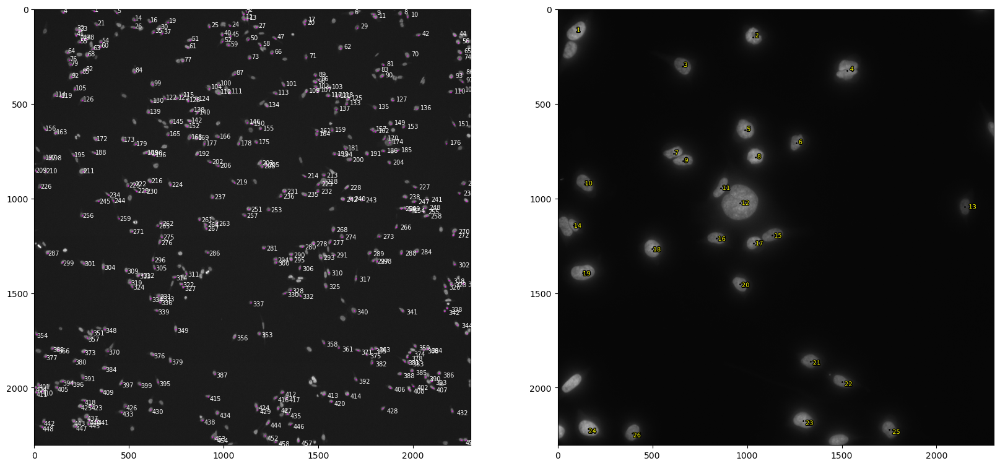

()

In [63]:
#for each pair of tiles in the well_fiducial_tiles dataframe, print out images and identify the number associated with the same cell at each magnification
PrintImagesWithAllNucCentroids(tile_lomag=157, tile_himag=2385, lomag_image_dir=lomag_processed_images_dir, himag_image_dir=himag_processed_images_dir,
                               cells_lomag_df=df_lomag, cells_himag_df=df_himag, 
                               well=well_ID, suppress_labels=False, sample_lomag=0.8, _vmax=2500)

In [64]:
#after investigation of above images, supply manually identified fiducial cell identities 
#cell_IDs
cellpair_lomag_himag = [174,12] #of form [cell_ID_in_lomag_image, cell_ID_in_himag_image]
cellpairs_list.append(cellpair_lomag_himag)

#tile_IDs - these will typically match the tileIDs provided in the dataframe, but on occaision, you may choose to search neighboring tiles if a shared cell can't be identified
tilepair_lomag_himag = [157,2385]
tilepairs_list.append(tilepair_lomag_himag)

In [65]:
#repeat this for every line in the well_fiducial_tiles dataframe
#after repeating this for 8-12 fiducials total:
cellpairs_list = [[1683, 36], [160, 8], [461, 19], [863, 22], [2587, 97], [1911, 92], [17, 16], [129, 20], [2063, 62], [45, 8], [675, 22], [655, 12]]
tilepairs_list = [[8, 64], [157, 2385], [89, 1227], [76, 1171], [32, 298], [23, 334], [133, 2115], [142, 2148], [40, 499], [125, 1947], [86, 1238], [79, 1182]]

In [66]:
fiducial_cells = pd.DataFrame({
    'cell_lomag': [pair[0] for pair in cellpairs_list],
    'cell_himag': [pair[1] for pair in cellpairs_list],
    'tile_lomag': [pair[0] for pair in tilepairs_list],
    'tile_himag': [pair[1] for pair in tilepairs_list],
    'well': well_ID})

In [67]:
#look up tilewise coordinates for each of these cells to later place on global coordinate scale
points_hi, points_lo = GetTilewiseLocations(df=fiducial_cells, himag_df=df_himag, lomag_df=df_lomag, well=well_ID)
points_hi, points_lo

(array([[  64,  871,  841],
        [2385,  780, 1042],
        [1227,  650, 1508],
        [1171,  487, 1622],
        [ 298, 1643, 1536],
        [ 334, 1749,  701],
        [2115,  585,  564],
        [2148, 1616, 1176],
        [ 499, 1275, 1746],
        [1947, 1294,  989],
        [1238,  753, 1184],
        [1182,  829,  594]]),
 array([[   8, 1471,  699],
        [ 157,  640, 1895],
        [  89,  725,  408],
        [  76, 1258, 1923],
        [  32, 2213,  951],
        [  23, 2236,  566],
        [ 133,   46, 1697],
        [ 142,  311,  285],
        [  40, 2099,  346],
        [ 125,  248, 1881],
        [  86,  750,  847],
        [  79, 1344, 1141]]))

### Use the coordinates of the fiducial cells to generate a translation, rotation, scaling matrix between the magnifications

In [68]:
# Get image height and width
example_tif_lomag = os.path.join(lomag_tiles_dir, random.choice([f for f in os.listdir(lomag_tiles_dir) if f.endswith('.tif')]))
example_tif_himag = os.path.join(himag_tiles_dir, random.choice([f for f in os.listdir(himag_tiles_dir) if f.endswith('.tif')]))

h_lomag, w_lomag = Load_TIF(example_tif_lomag).shape
h_himag, w_himag = Load_TIF(example_tif_himag).shape

In [69]:
# Generate a starting grid to represent how tiles relate to each other in 2d space.
# This will depend on the manner in which the stage moves as images are collected, and will be investigated later and corrected if necessary
untested_grid_lomag, lomag_coord_df = GenerateTileGrid(path_name=lomag_tiles_dir, well=12)
untested_grid_himag, himag_coord_df = GenerateTileGrid(path_name=himag_tiles_dir, well=12)

100%|██████████| 2448/2448 [00:10<00:00, 243.63it/s]


In [70]:
print(untested_grid_lomag)

[[ -1  -1  -1  -1  -1   3   2   1   0  -1  -1  -1  -1  -1]
 [ -1  -1  -1   4   5   6   7   8   9  10  11  -1  -1  -1]
 [ -1  -1  21  20  19  18  17  16  15  14  13  12  -1  -1]
 [ -1  22  23  24  25  26  27  28  29  30  31  32  33  -1]
 [ 47  46  45  44  43  42  41  40  39  38  37  36  35  34]
 [ 48  49  50  51  52  53  54  55  56  57  58  59  60  61]
 [ 75  74  73  72  71  70  69  68  67  66  65  64  63  62]
 [ 76  77  78  79  80  81  82  83  84  85  86  87  88  89]
 [103 102 101 100  99  98  97  96  95  94  93  92  91  90]
 [104 105 106 107 108 109 110 111 112 113 114 115 116 117]
 [131 130 129 128 127 126 125 124 123 122 121 120 119 118]
 [ -1 132 133 134 135 136 137 138 139 140 141 142 143  -1]
 [ -1  -1 153 152 151 150 149 148 147 146 145 144  -1  -1]
 [ -1  -1  -1 154 155 156 157 158 159 160 161  -1  -1  -1]
 [ -1  -1  -1  -1  -1 165 164 163 162  -1  -1  -1  -1  -1]]


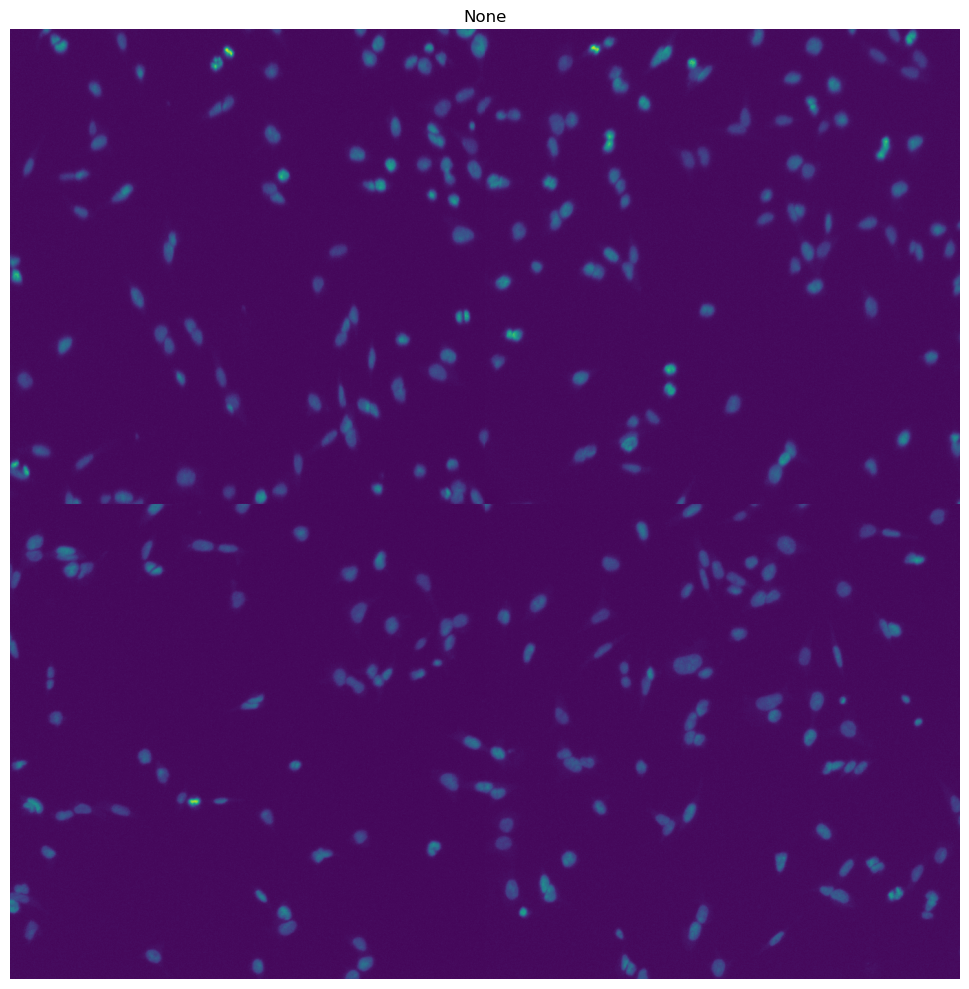

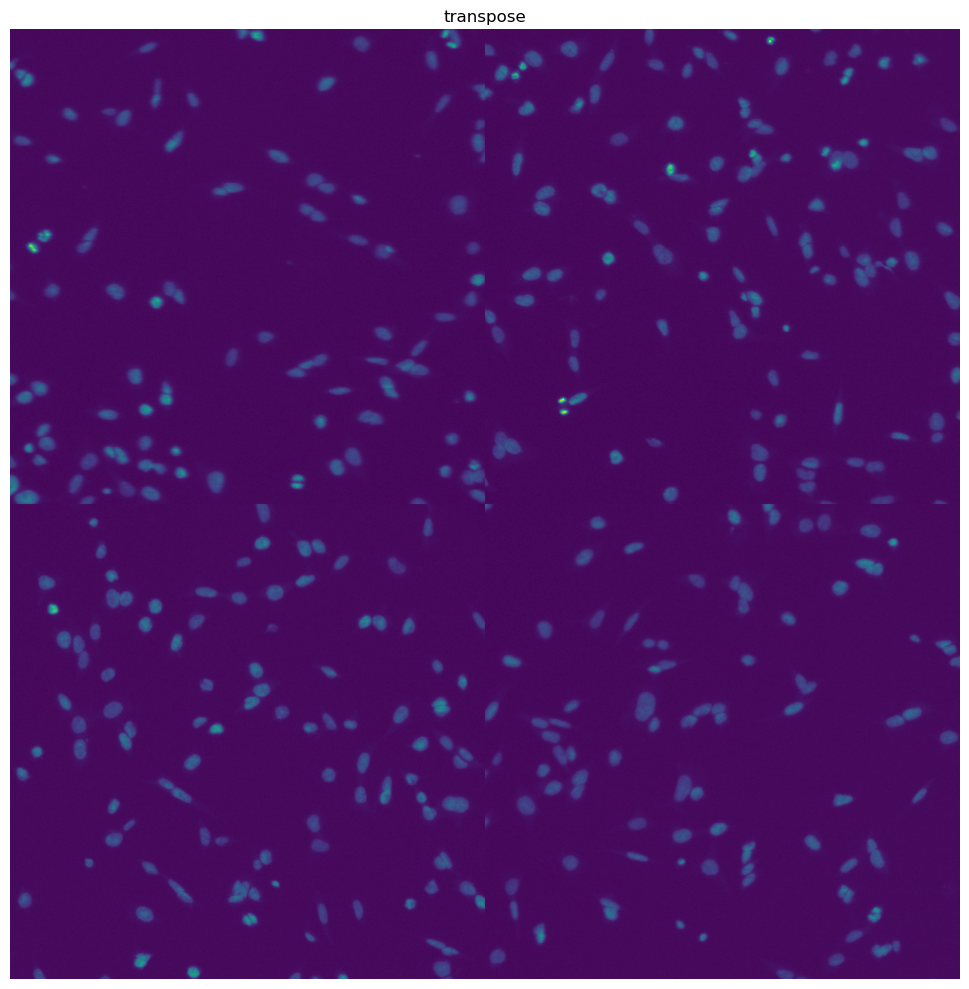

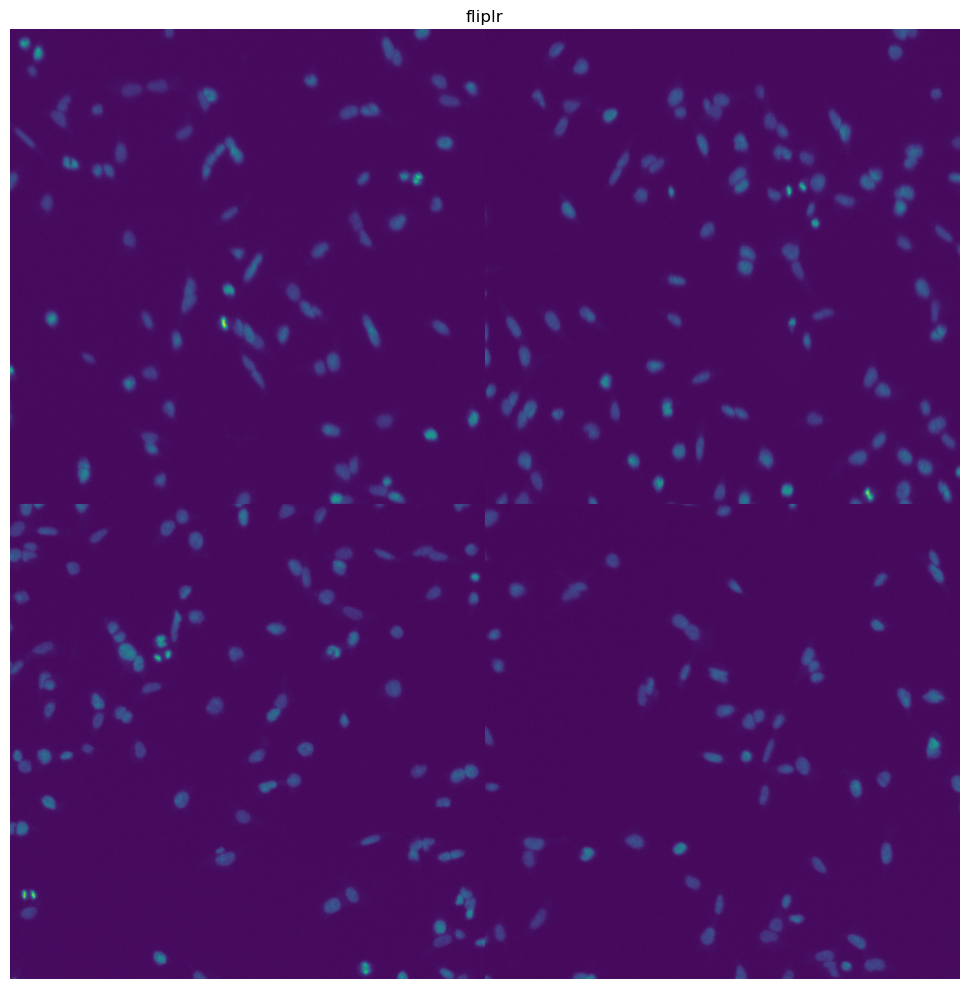

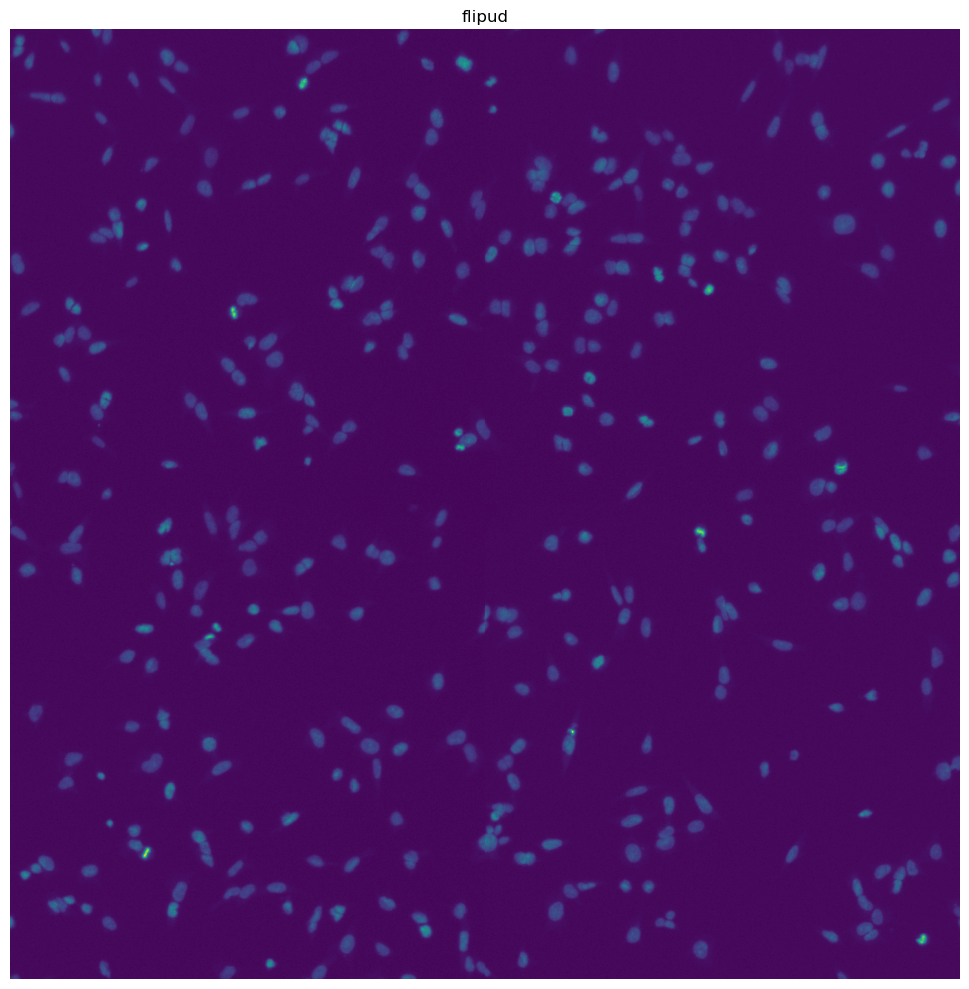

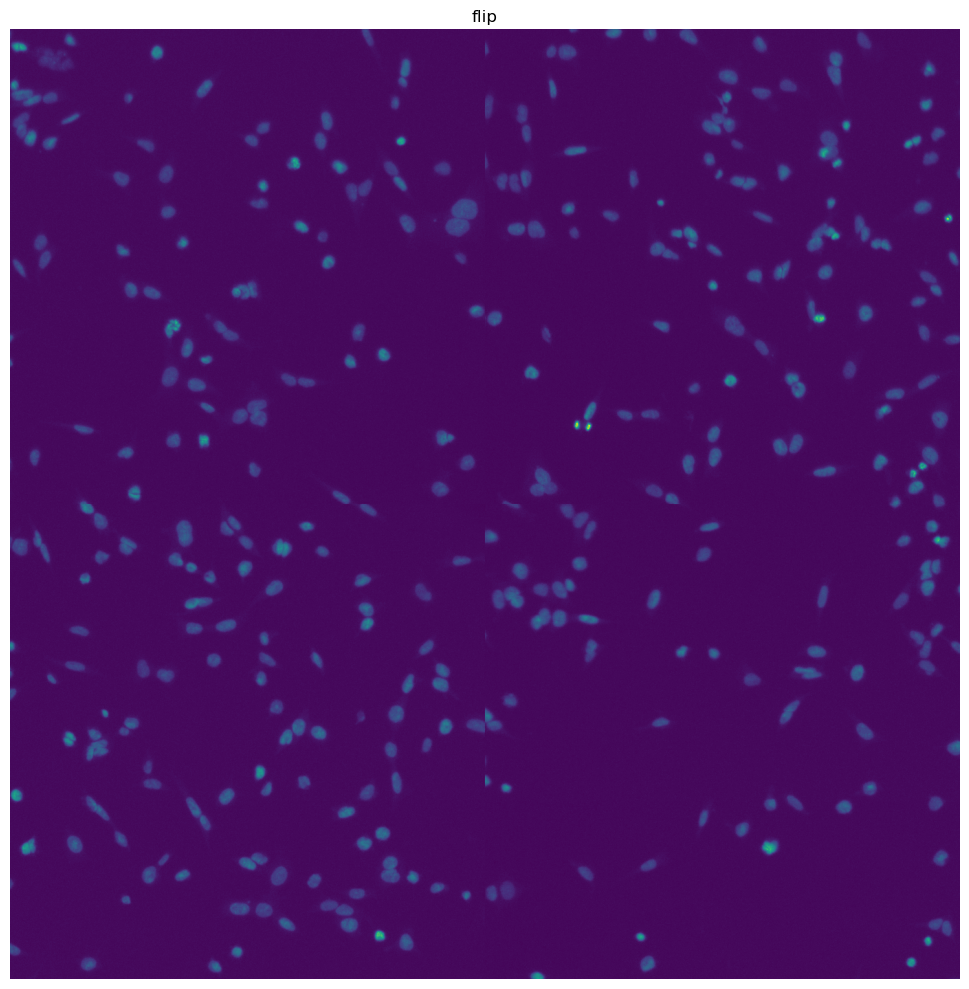

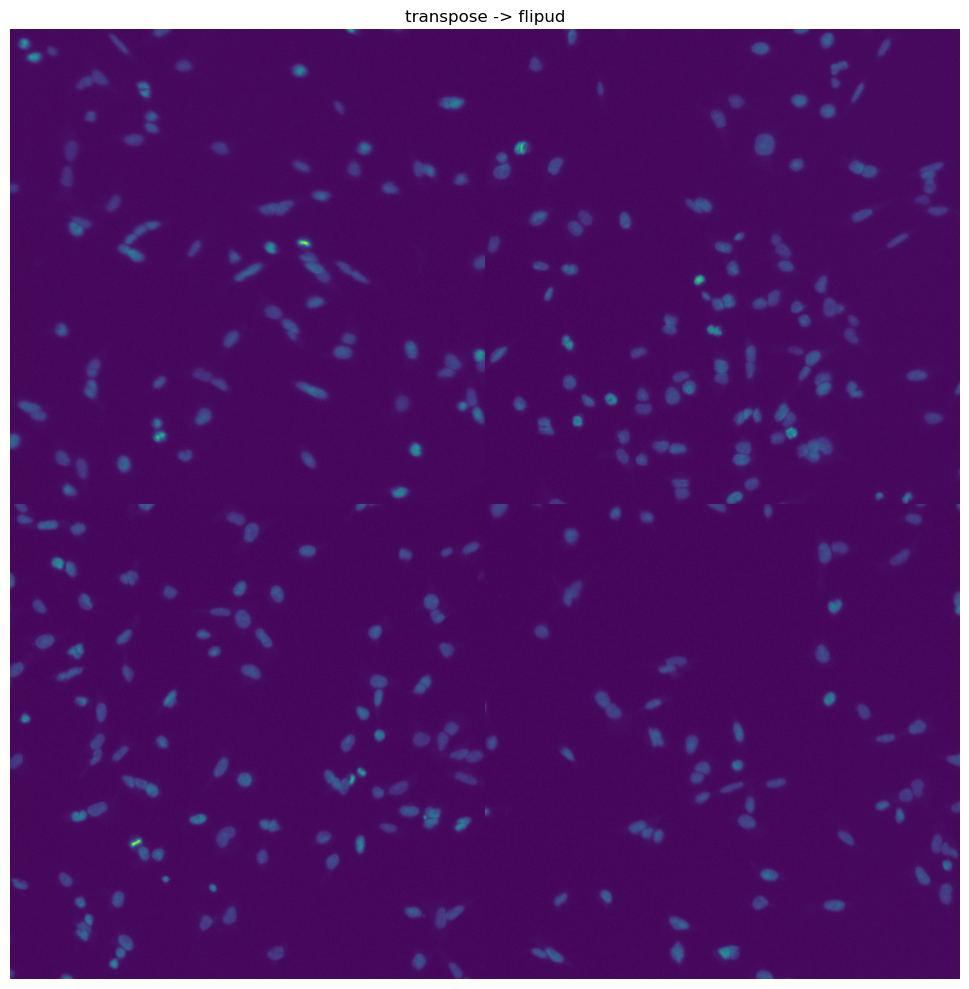

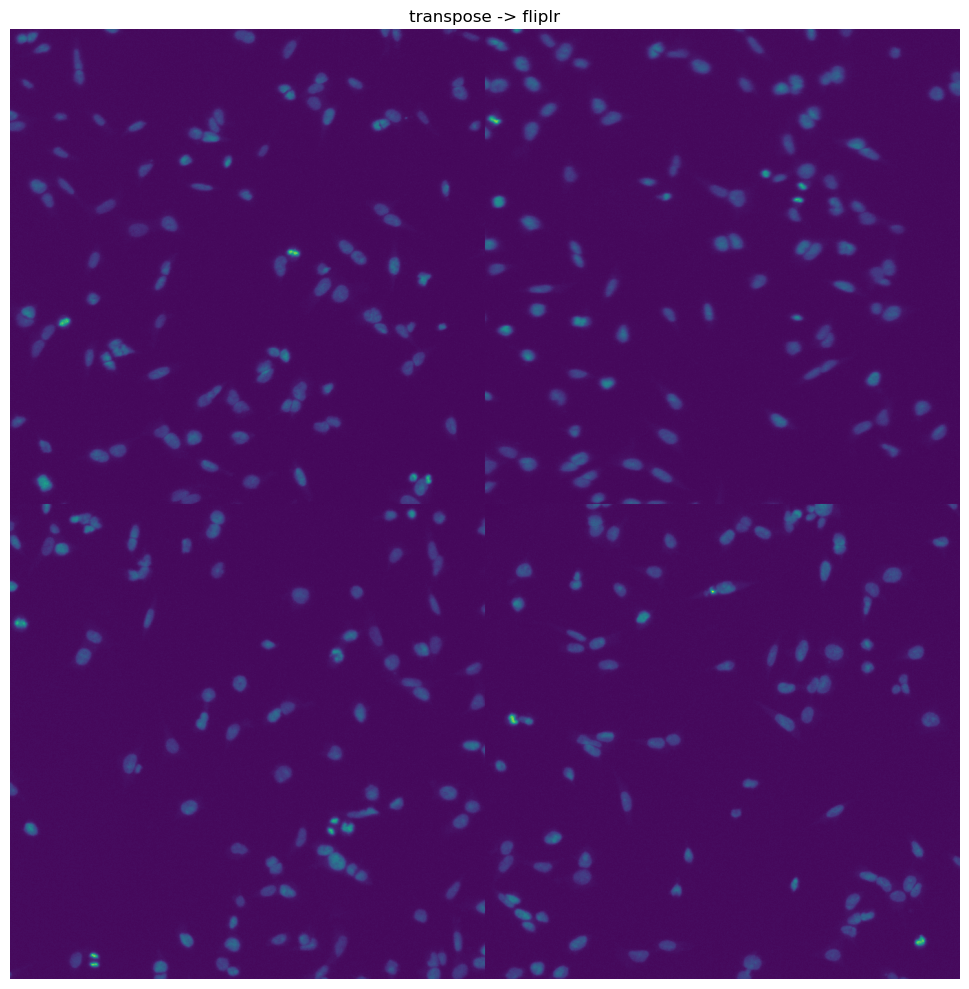

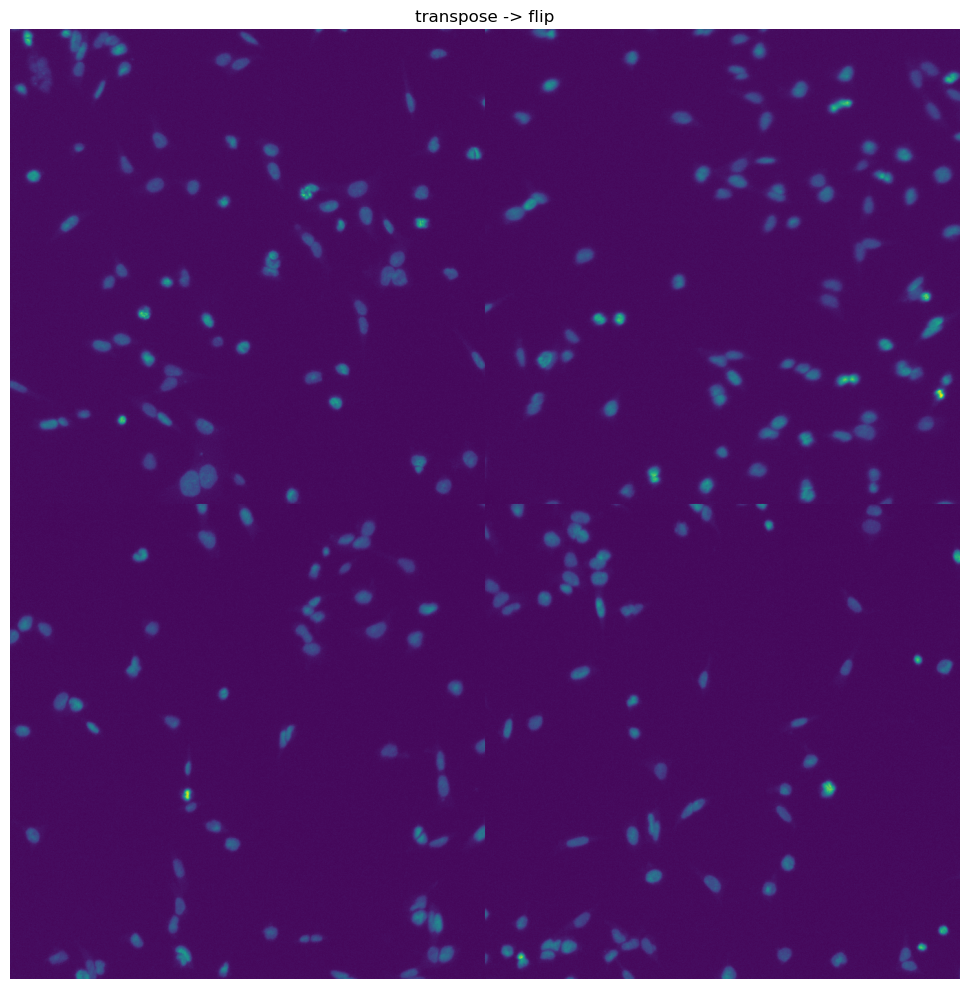

In [71]:
#let's test arrangment by picking a set of four tiles that are adjacent in the grid, and determining which transformation (if any) is required to align them
input_dict = {'top_left':81,'top_right':82,'bottom_left':98,'bottom_right':97}
TestTileGrid(input_dict, lomag_tiles_dir, lomag_coord_df, zoom=True, zoom_factor=0.7) #it can be helpful to zoom in when checking lomag images

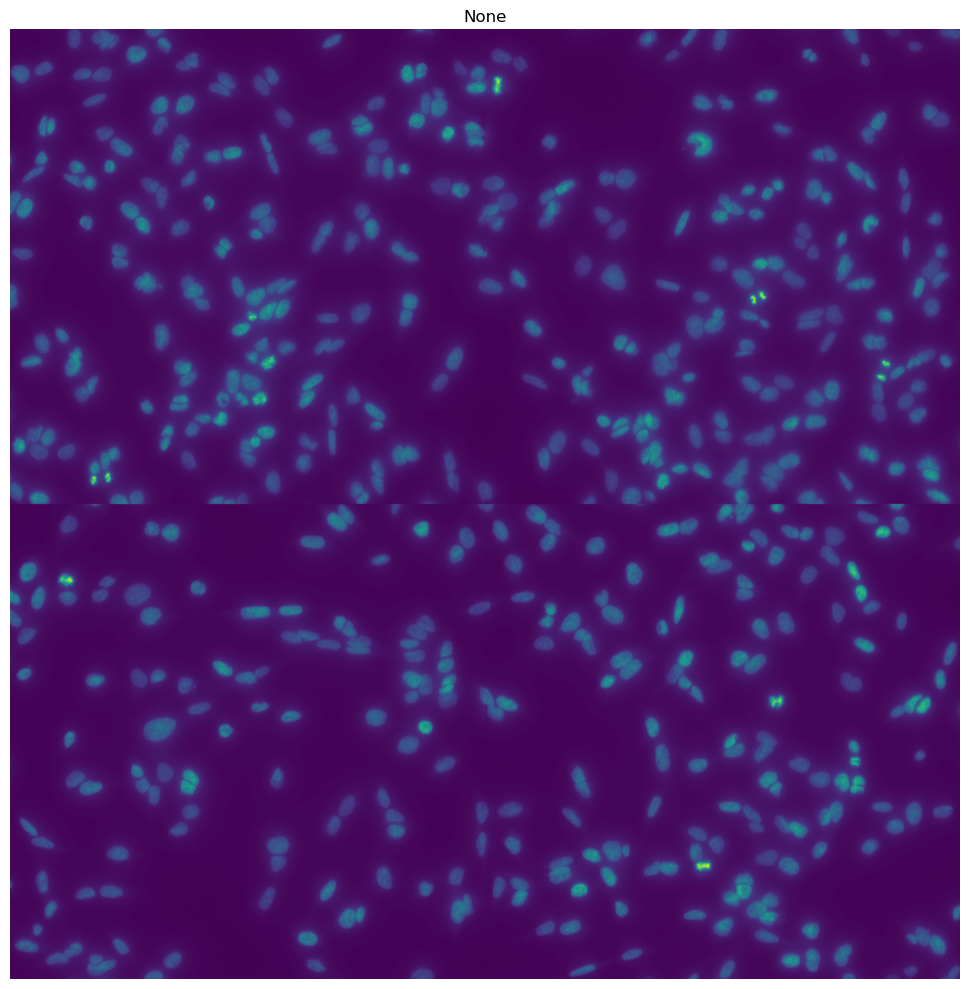

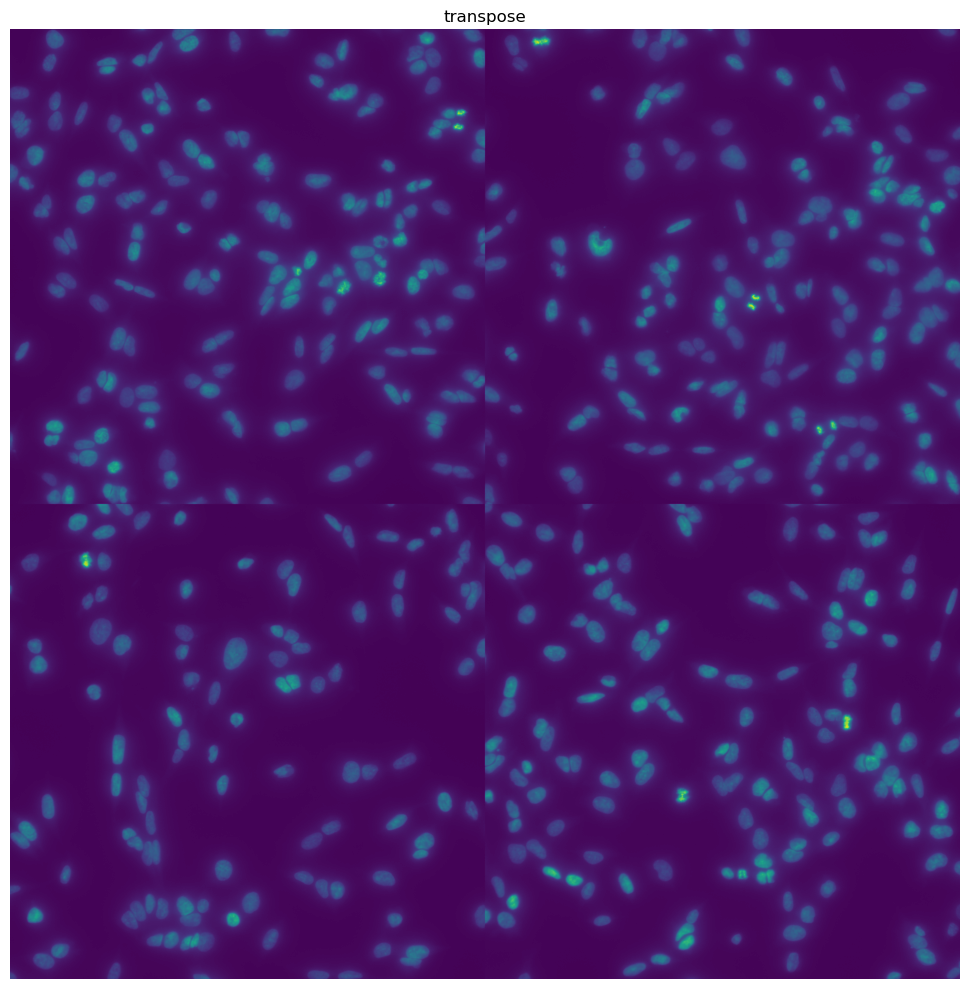

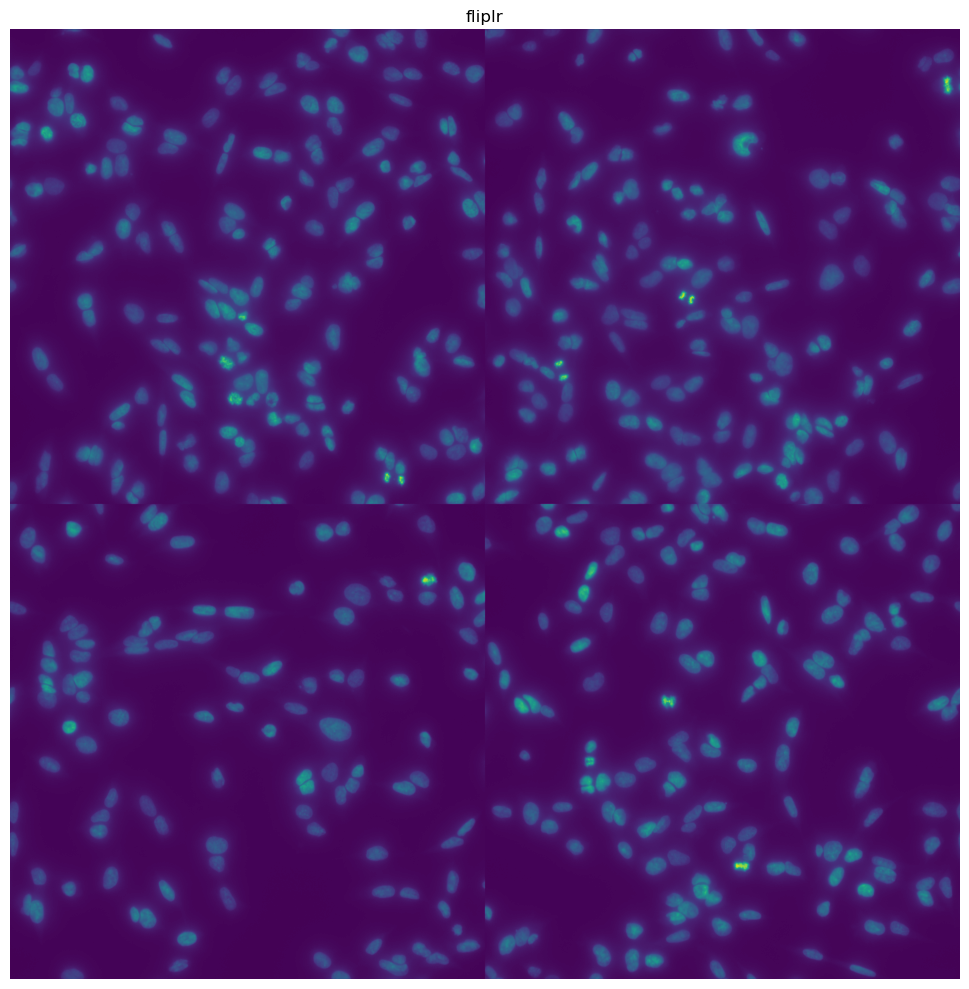

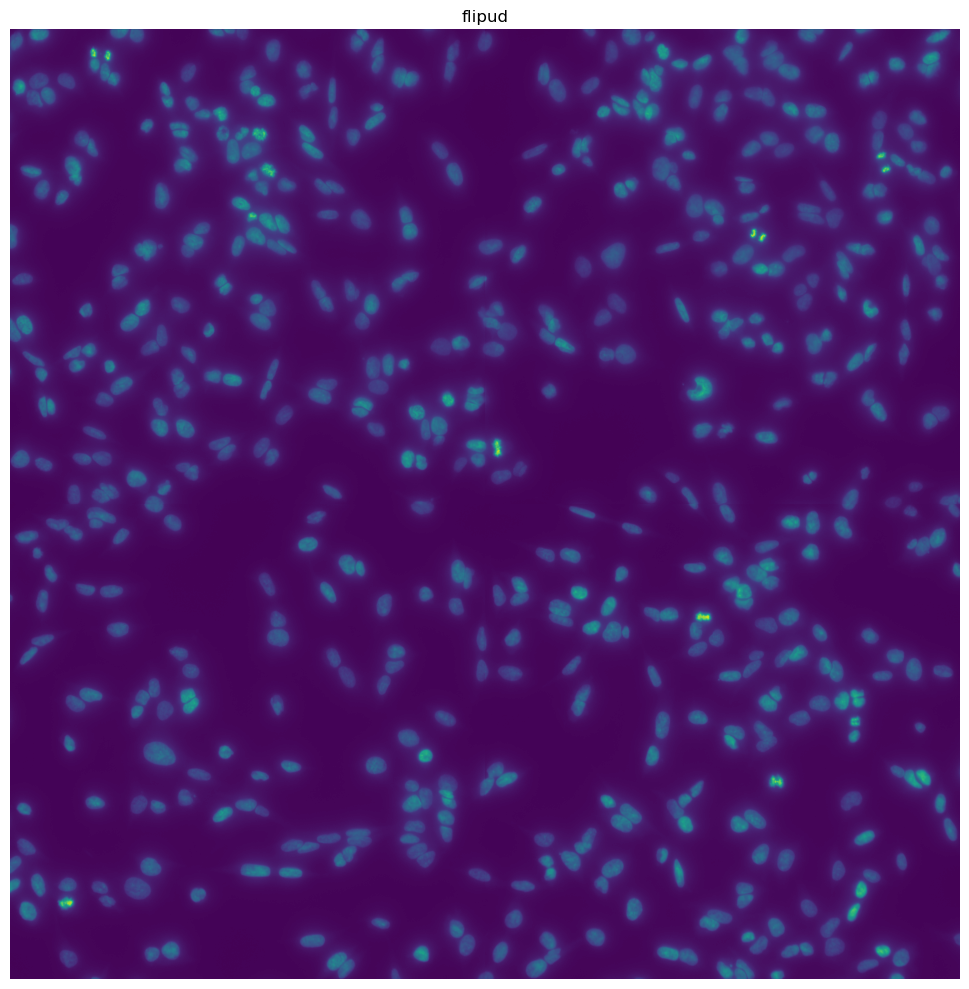

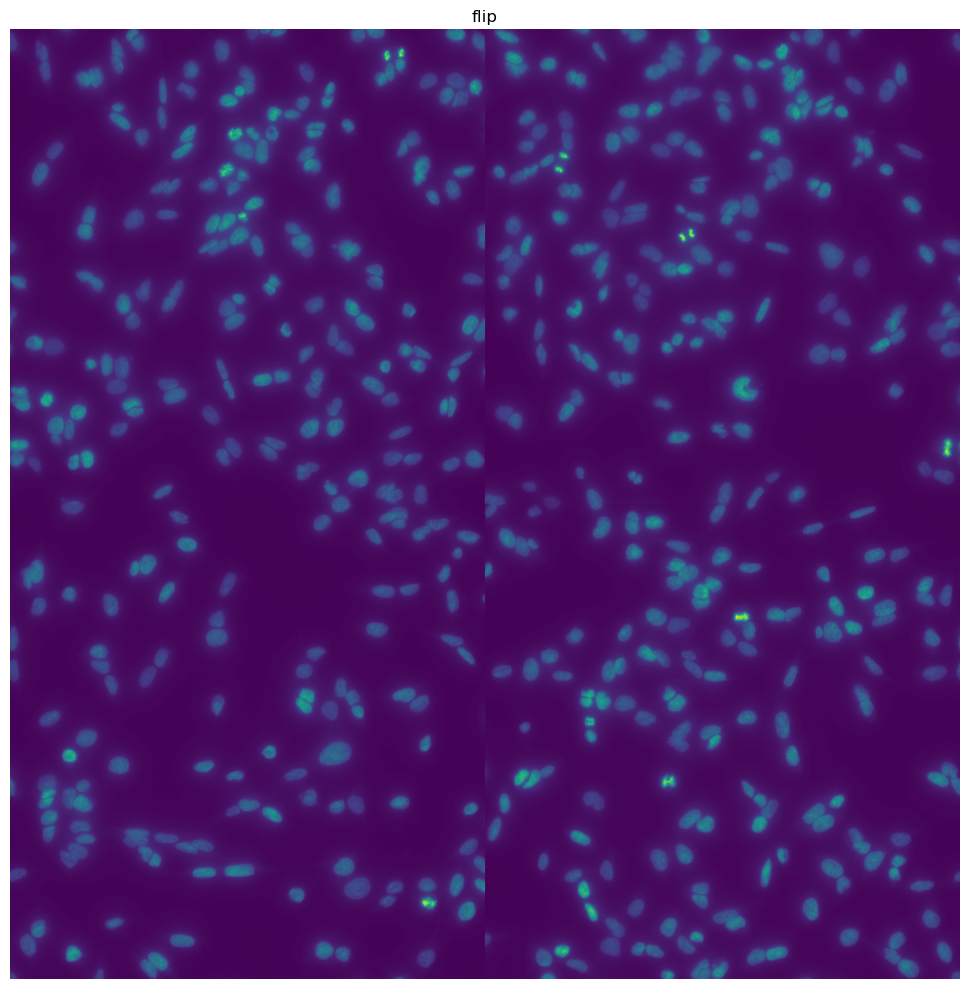

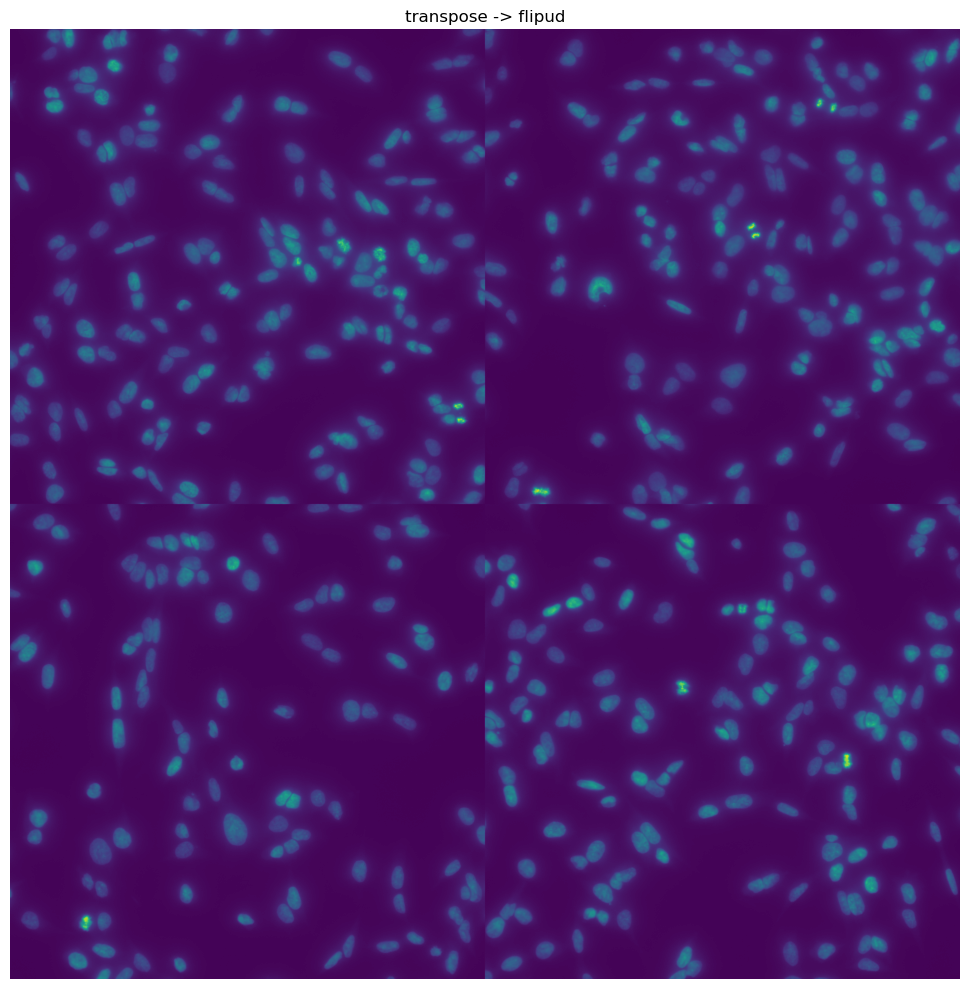

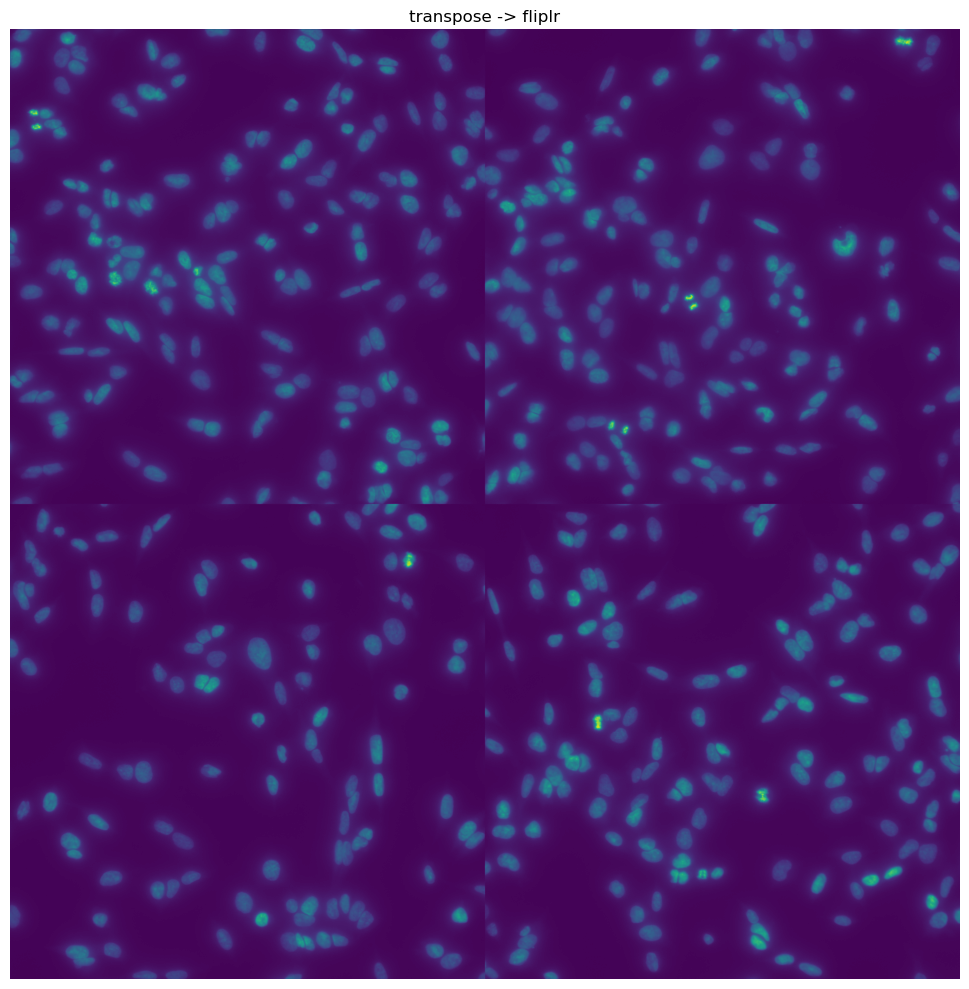

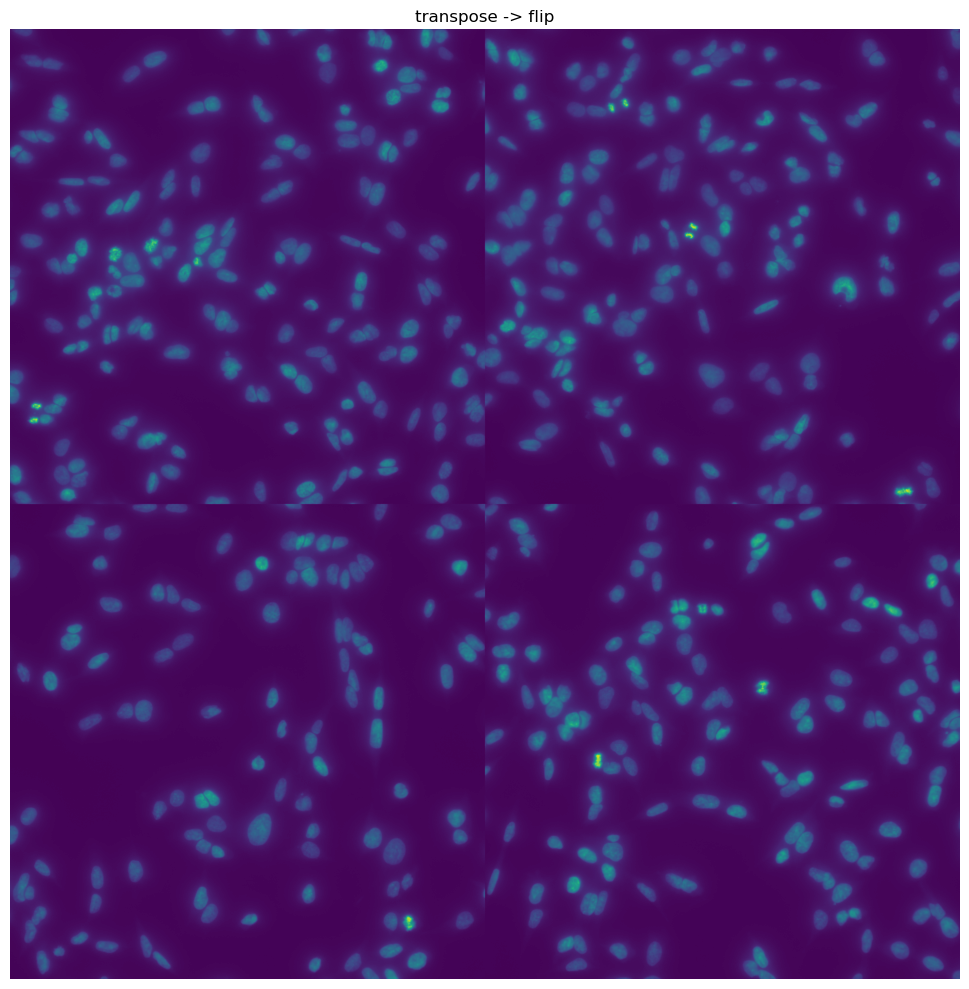

In [72]:
#confirming same is true for high magnification images
input_dict = {'top_left':439,'top_right':440,'bottom_left':512,'bottom_right':511}
TestTileGrid(input_dict, himag_tiles_dir, himag_coord_df, zoom=False, zoom_factor=0)

In [73]:
#update tile grid to reflect most seamless orientation
arranged_grid_lomag = SetTileConfiguration('flipud', untested_grid_lomag)
arranged_grid_himag = SetTileConfiguration('flipud', untested_grid_himag)

In [74]:
#Use updated tile arrangement grids, pre-calculated fiducial points at each magnification, and image dimensions to calculate mapping parameters
P_lomag = Local_to_Global(points_lo, arranged_grid_lomag, [h_lomag, w_lomag])
P_himag = Local_to_Global(points_hi, arranged_grid_himag, [h_himag, w_himag])

mapping_parameters = Fit_By_Points(P_lomag, P_himag, verbose=True)

     fun: 464.353648201308
     jac: array([-2.38800049e-03, -4.55093384e-03,  2.65113831e+00, -1.82734680e+00,
       -2.47710533e+01])
 message: 'Optimization terminated successfully'
    nfev: 105
     nit: 12
    njev: 12
  status: 0
 success: True
       x: array([-1.00227529e+03,  2.25806057e+02,  1.18973410e-02,  3.96721414e+00,
        3.96621538e+00])
Pixel Errors (X,Y)
Point  0 [7.0, -4.0]
Point  1 [2.0, 7.0]
Point  2 [-0.0, -8.0]
Point  3 [3.0, -3.0]
Point  4 [-4.0, 6.0]
Point  5 [-6.0, -3.0]
Point  6 [3.0, -0.0]
Point  7 [-2.0, 0.0]
Point  8 [-3.0, 2.0]
Point  9 [-7.0, 4.0]
Point  10 [-2.0, -2.0]
Point  11 [9.0, 0.0]


### Verify mapping parameters by mapping a subset of cells and confirming their location at the second magnification

In [75]:
df_all_reads = df_lomag

In [76]:
subset_cells = df_all_reads[(df_all_reads["design"]=="ENST00000309318.8_1_3__11") & (df_all_reads["well"]==well_ID)& (df_all_reads["cell_barcode_count_1"]<1)].sample(10)
lomag_subset = np.array(subset_cells[['tile','i_nucleus','j_nucleus']]).astype(int)

In [77]:
#calculating global coordinates from lomag image
calculated_P_lomag_subset = Local_to_Global(lomag_subset, arranged_grid_lomag, [h_lomag, w_lomag])

#using mapping parameters calculated above to calculate global higher mag coordinates
calculated_P_himag_subset = model_TRS(calculated_P_lomag_subset, mapping_parameters, angle='degree')

#use global higher mag coordinates to translate to local higher mag coordinates
reverse_calc_p_himag_subset = Global_to_Local(calculated_P_himag_subset, arranged_grid_himag, [h_himag, w_himag])

  0%|          | 0/10 [00:00<?, ?it/s]

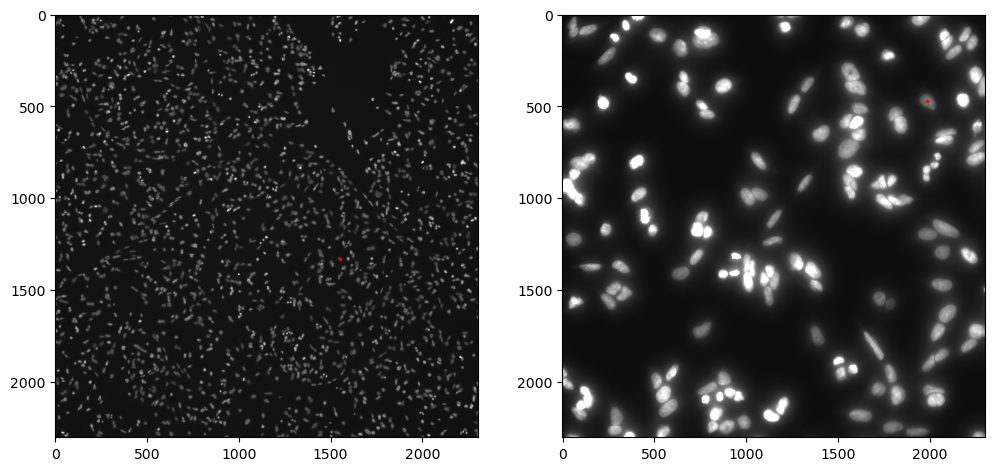

 10%|█         | 1/10 [00:00<00:08,  1.11it/s]

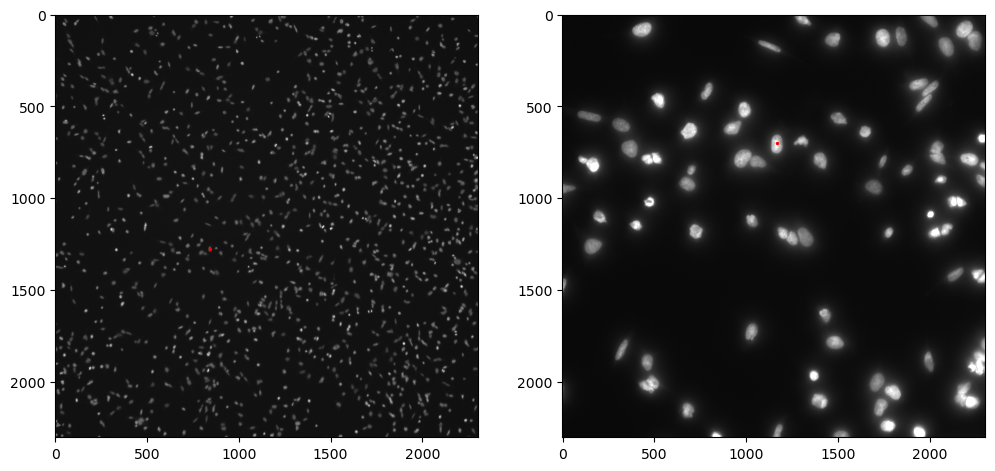

 20%|██        | 2/10 [00:01<00:07,  1.12it/s]

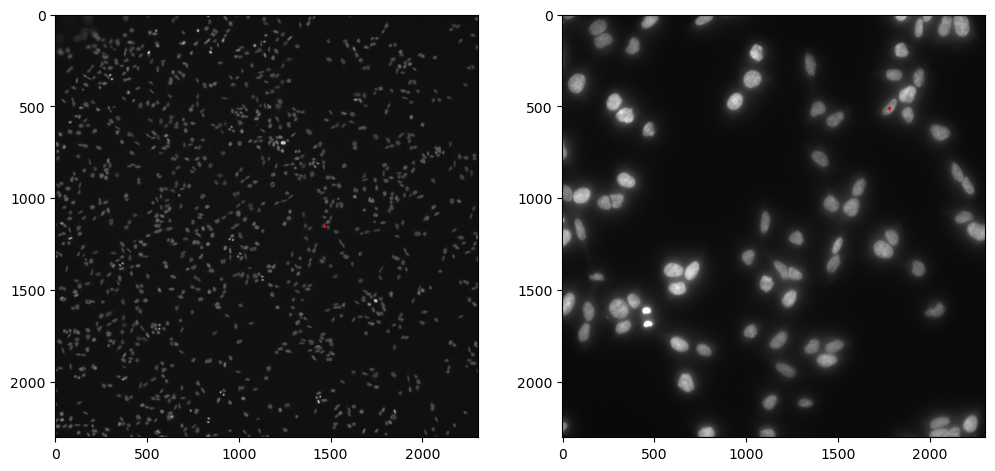

 30%|███       | 3/10 [00:02<00:06,  1.07it/s]

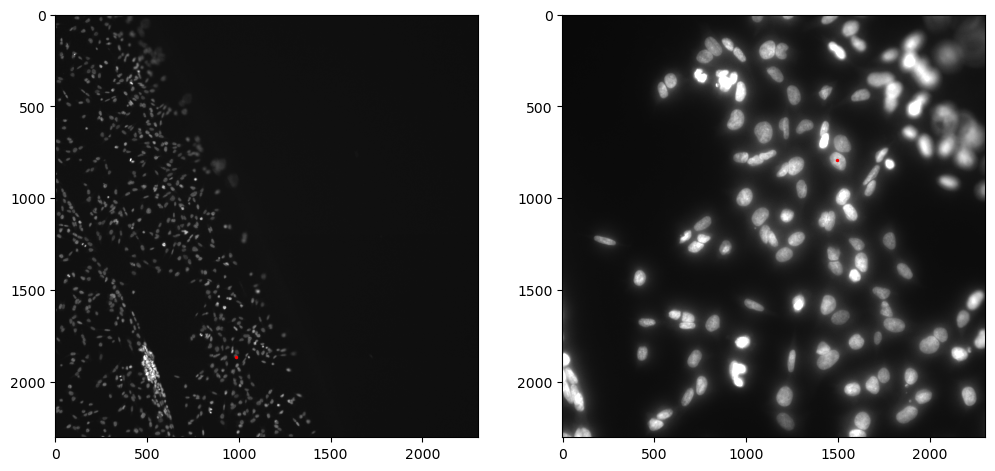

 40%|████      | 4/10 [00:03<00:05,  1.09it/s]

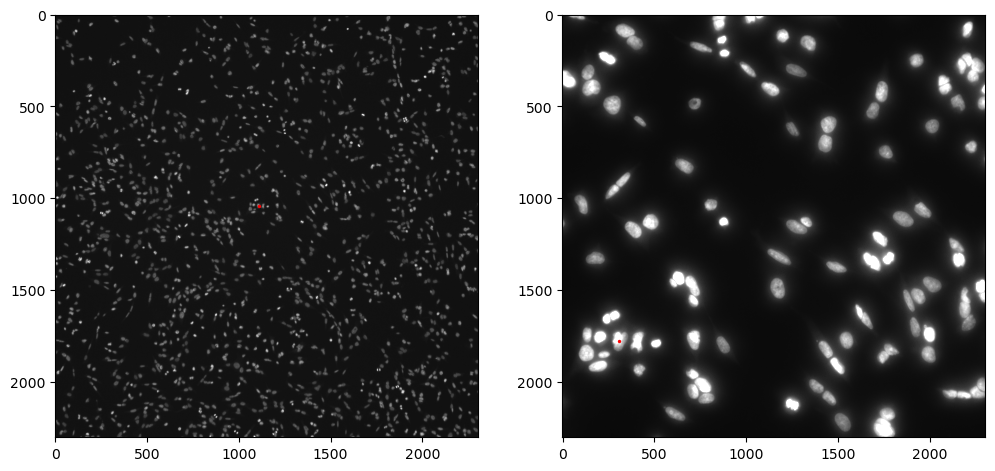

 50%|█████     | 5/10 [00:04<00:04,  1.10it/s]

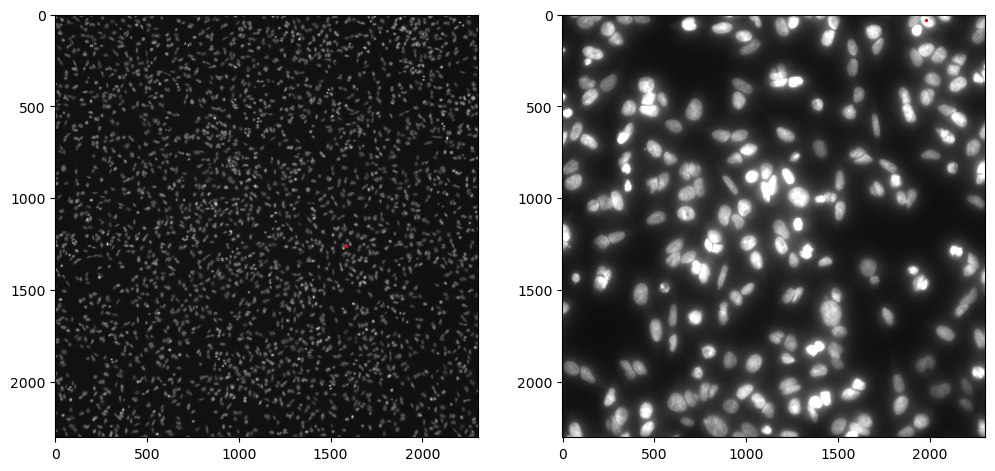

 60%|██████    | 6/10 [00:05<00:03,  1.12it/s]

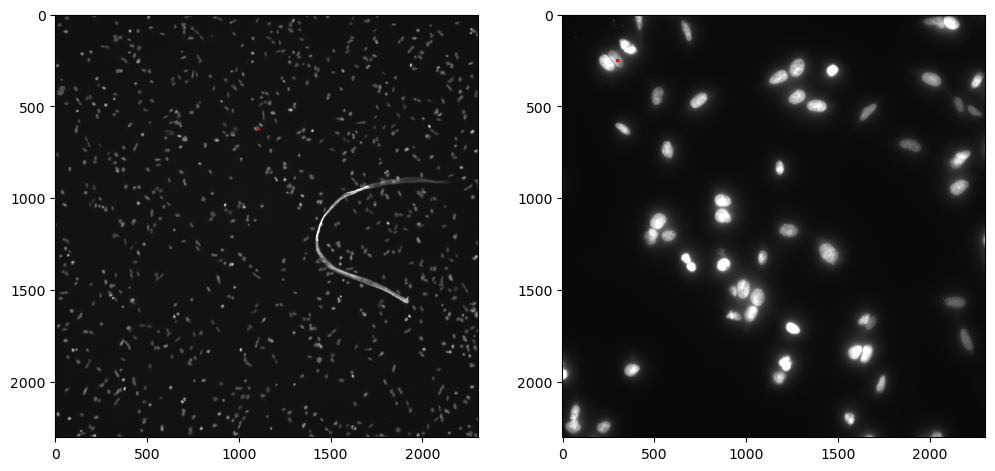

 70%|███████   | 7/10 [00:06<00:02,  1.14it/s]

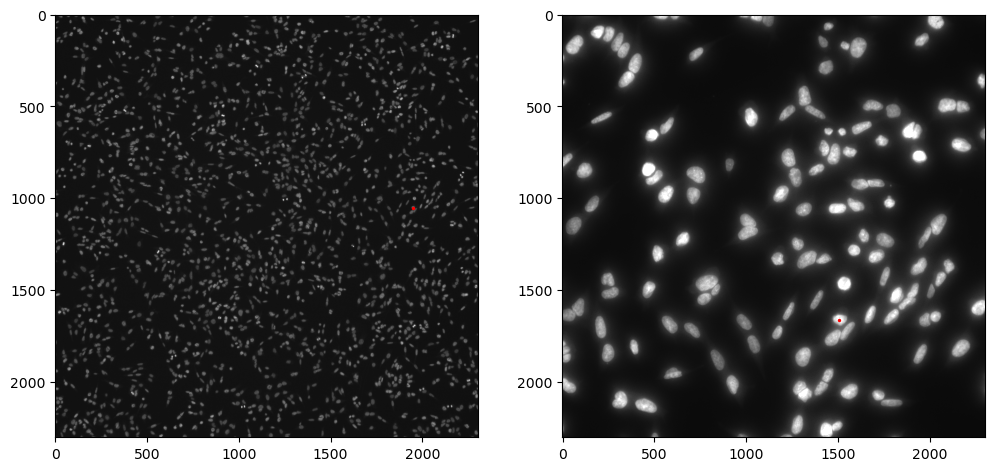

 80%|████████  | 8/10 [00:07<00:01,  1.13it/s]

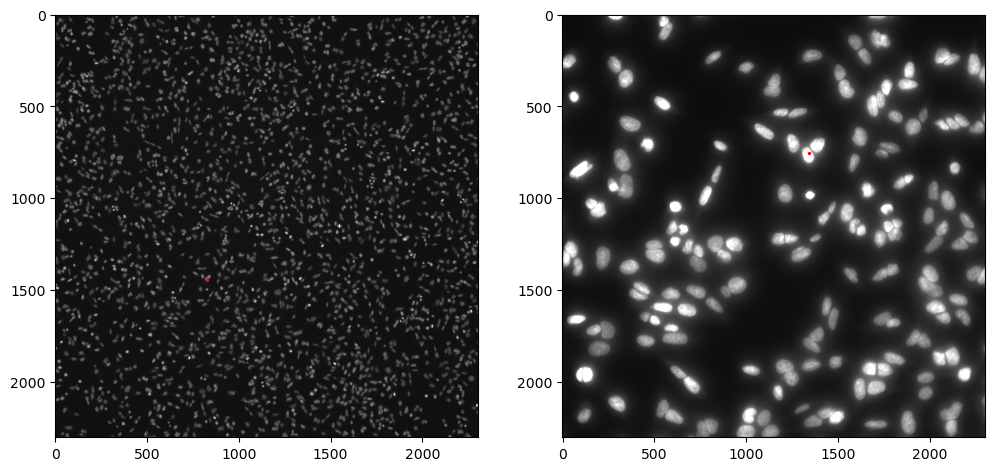

 90%|█████████ | 9/10 [00:08<00:00,  1.12it/s]

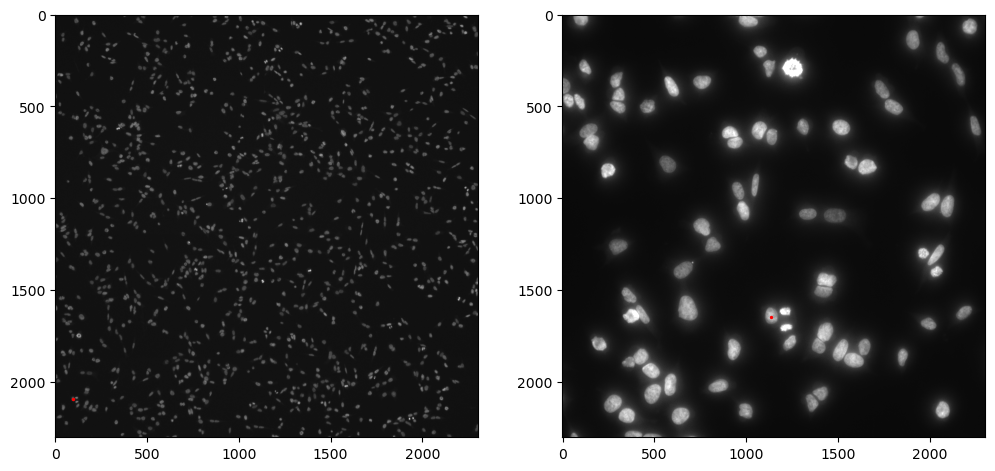

100%|██████████| 10/10 [00:08<00:00,  1.11it/s]


In [78]:
#use local lomag coordinates and calculated local higher mag coordinates to look up the same cell at each magnification
#inspect visually that red dot lands on same cell in each image
Plot_Point_Mapping_tif(lomag_subset, reverse_calc_p_himag_subset, lomag_coord_df, himag_coord_df, lomag_tiles_dir, himag_tiles_dir, _vmax=4000)

### Use validated mapping parameters to join lower magnification (i.e., genotype) information with higher magnification (i.e., phenotype) information

In [79]:
#retrieve local coordinates of cells with reads
df_genotype = df_all_reads[(df_all_reads['cell_barcode_count_0'] > 0) & (df_all_reads["well"]==well_ID)].reset_index(drop=True)
lomag_local_coords = np.array(df_genotype[['tile','i_nucleus','j_nucleus']]).astype(int)

#calculate global coordinate of each cell
calculated_P_lomag = Local_to_Global(lomag_local_coords, arranged_grid_lomag, [h_lomag, w_lomag])

#use mapping parameters validated above to calculate global higher mag coordinates of each cell
calculated_P_himag = model_TRS(calculated_P_lomag, mapping_parameters, angle='degree')

#use global higher mag coordinates to translate to local higher mag coordinates, which are associated with phenotype information
reverse_calc_p_himag = Global_to_Local(calculated_P_himag, arranged_grid_himag, [h_himag, w_himag])

In [80]:
#concatenate genotype and phenotype information
df_highmag_coords = pd.DataFrame(data=reverse_calc_p_himag, columns=['tile_himag','i_himag','j_himag'])
df_genotype[['tile_himag','i_himag','j_himag']] = df_highmag_coords[['tile_himag','i_himag','j_himag']]
df_genotype.to_csv("Well"+str(well_ID)+'_reads_himag-mapped.csv')

In [81]:
df_genotype.sample(10)

,well,tile,cell,peak,cell_barcode_0,cell_barcode_count_0,cell_barcode_1,cell_barcode_count_1,barcode_count,i_cell,...,dapi_min_nucleus,sgRNA,design,duplicate_prefix,sgRNA_1,design_1,duplicate_prefix_1,tile_himag,i_himag,j_himag
132583,12,120,873,215.84412,CAGGCACAGT,1.0,NaN,0.0,1.0,1753.214652,...,330,CAGGCACAGT,ENST00000309083.8_1_4__379,False,NaN,NaN,NaN,1780,374,1674
134409,12,124,271,117.99203,AGTCACCTTC,1.0,AGTCACCGTC,1.0,2.0,2004.004691,...,355,NaN,NaN,NaN,AGTCACCGTC,ENST00000309318.8_1_3__149,False,1793,1356,83
57555,12,41,736,209.72986,AACCTCGCTG,1.0,NaN,0.0,1.0,926.868300,...,338,NaN,NaN,NaN,NaN,NaN,NaN,600,1245,1297
151844,12,155,342,165.51083,GTGGAAGTAT,1.0,NaN,0.0,1.0,773.218000,...,235,NaN,NaN,NaN,NaN,NaN,NaN,2393,1293,1948
28846,12,20,1723,143.47513,GAGAGGTCCC,1.0,GAGAGGGCGC,1.0,3.0,1946.630400,...,319,NaN,NaN,NaN,GAGAGGGCGC,ENST00000371964.5_1_5__19,False,170,543,298
116828,12,100,476,262.50280,GTGGAAGCAC,1.0,NaN,0.0,1.0,1024.119454,...,377,NaN,NaN,NaN,NaN,NaN,NaN,1491,1930,1939
130382,12,117,577,168.74684,GAGGCCCCTG,2.0,GTGGCCCCTG,1.0,3.0,1144.187564,...,306,GAGGCCCCTG,ENST00000309318.8_1_3__11,False,NaN,NaN,NaN,1664,155,1588
37082,12,26,1891,194.64827,TCCACAGCCG,2.0,NaN,0.0,2.0,2200.776923,...,340,NaN,NaN,NaN,NaN,NaN,NaN,321,1630,787
88299,12,66,1498,197.49457,GAGGCCCCTG,1.0,NaN,0.0,1.0,1740.847114,...,340,GAGGCCCCTG,ENST00000309318.8_1_3__11,False,NaN,NaN,NaN,908,8,2254
124825,12,109,108,205.07668,TCGCGTCTCG,4.0,NaN,0.0,4.0,315.223126,...,334,NaN,NaN,NaN,NaN,NaN,NaN,1738,1498,928


In [ ]:
#the higher mag coordinates can now be used to print out images of cells all unified by some feature described in df_genotype, e.g., sgRNA sequence